# DEEP LEARNING PROJECT
# Image segmentation: buildings detection from satellite images

Duc Nguyen DUONG and Sofia AIT AHCENE

# Introduction

Our project aims to automatically detect buildings from satellite images. This task has a lot of potential applications, from monitoring movements
of populations in remote areas to evaluating the available surface to implant solar panels on roofs.

We developed a Convolutional Neural Network for the extraction of buildings from satellite images, adapted from a U-net originally developed for biomedical image segmentation. We trained our model on satellite images and on ground-truth labels extracted from IGN open data.

This project addresses the broader issue of semantic
segmentation of satellite images by aiming at classifying each pixel as belonging to a building or not. We developed a Convolutional Neural Network suitable for this task, inspired from the U-net. We trained our model on a set of two-dimensional satellite images. The corresponding labels were binary masks, ie. two-dimensional matrices with ones for pixels where a building was present, zeros otherwise.
Given a satellite image as input, our network was then able to output a corresponding predicted binary mask.



# Related work

The automatic detection of buildings is a problem that has been the subject of much research.

Lots of earlier work relied firstly on segmentation techniques in order to generate rooftops candidates. Then, they used discriminatuve features (intensity, shape, area..) to identify the true rooftops within the set of candidates.

Many methods that subsequently emerged used machine learning algorithms for identifying the true rooftops among the candidates.

In recent years, research has focused mainly on deep learning techniques to detect buildings. Among the research in this area, we can cite the work of Qin et al. (2019) who have developed a Deep Convolution Neural Network with both convolutional and deconvolutional layers.

# Methods

### Building of the dataset

The dataset contains 338 training images and 67 validation images. It comes from IGN open dataset by matching topo data and ortho-images. As a part of Nguyen's internship, he produced this little sample dataset for testing some algorithms and architectures. So, we reused this data for the project.

The dataset contains images of different sizes, so a resize transformation is needed as a data preprocessing step.


### Load dataset and packages

In [ ]:
from google.colab import drive
drive.mount('/content/drive') 

Mounted at /content/drive


In [ ]:
%%capture
!unzip /content/drive/MyDrive/IGN/segmentation_400.zip

In [ ]:
%%capture
!pip install pytorch-lightning

In [ ]:
# import standard PyTorch modules
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import DataLoader
from torch.optim.lr_scheduler import ReduceLROnPlateau

# import torchvision module to handle image manipulation
import torchvision
import torchvision.transforms as transforms
from torchvision import datasets
import os
import matplotlib.pyplot as plt
import numpy as np
import pytorch_lightning as pl
import random

In [ ]:
batch_size = 4
num_workers = 2
dir = "/content/content/data/segmentation"

### Data augmentation

Since Pytorch doesn't have built-in functions for semantic segmentation data augmentation (because we need to apply the same transformations to the image and the mask), we need to build our proper classes for data augmentation.

We are working with satellite imagery so flip the image doesn't change much about spatial context, so we gonna apply only one transformation: randomly rotate the image and the mask.

In [ ]:
class RandomRotate(object):
    def __init__(self, degree):
        self.degree = degree

    def __call__(self, img, mask):
        rotate_degree = random.random() * 2 * self.degree - self.degree
        return img.rotate(rotate_degree, Image.BILINEAR), mask.rotate(rotate_degree, Image.NEAREST)

class Resize(object):
    def __init__(self, size):
        self.size = size
        self.resize = transforms.Resize((self.size,self.size))
    def __call__(self, img, mask):
        return self.resize(img),self.resize(mask)

class ToTensor(object):
    def __init__(self):
        self.totensor = transforms.ToTensor()
    def __call__(self, img, mask):
        return self.totensor(img),self.totensor(mask) 

In [ ]:
import torch
from PIL import Image
from torch.utils import data


class SegmentationDataSet(data.Dataset):
    def __init__(self,
                 inputs: list,
                 targets: list,
                 transform=None
                 ):
        self.inputs = inputs
        self.targets = targets
        self.transform = transform
        self.inputs_dtype = torch.float32
        self.targets_dtype = torch.long

    def __len__(self):
        return len(self.inputs)

    def __getitem__(self,
                    index: int):
        # Select the sample
        input_ID = self.inputs[index]
        target_ID = self.targets[index]

        # Load input and target
        x, y = Image.open(input_ID), Image.open(target_ID)

        # Preprocessing
        if self.transform is not None:
            for t in self.transform:
                x, y = t(x, y)
        return x, y

In [ ]:
composed_train = [RandomRotate(20),Resize(256),ToTensor()]
composed_valid = [Resize(256),ToTensor()]

In [ ]:
def get_filenames_of_path(dir):
    filenames = [os.path.join(dir,file) for file in os.listdir(dir)]
    return filenames

In [ ]:
train_images = get_filenames_of_path(os.path.join(dir,"images/train"))
train_mask = get_filenames_of_path(os.path.join(dir,"mask/train"))
val_images = get_filenames_of_path(os.path.join(dir,"images/val"))
val_mask = get_filenames_of_path(os.path.join(dir,"mask/val"))

In [ ]:
# dataset training
dataset_train = SegmentationDataSet(inputs=train_images,
                                    targets=train_mask,
                                    transform=composed_train)

# dataset validation
dataset_valid = SegmentationDataSet(inputs=val_images,
                                    targets=val_mask,
                                    transform=composed_valid)

# dataloader training
dataloader_training = DataLoader(dataset=dataset_train,
                                 batch_size=batch_size,
                                 shuffle=True)

# dataloader validation
dataloader_validation = DataLoader(dataset=dataset_valid,
                                   batch_size=batch_size)

In [ ]:
print("train dataset : {}".format(len(dataset_train)))
print("valid dataset : {}".format(len(dataset_valid)))

train dataset : 338
valid dataset : 67


### Data visualisation


In [ ]:
def show(display_list):
    rows, cols = len(display_list), len(display_list[0])
    plt.figure(figsize=(7 * cols, 7 * rows))
    for r in range(rows):
        for c in range(cols):
            i = r * cols + c + 1
            plt.subplot(rows, cols, i)
            img = torchvision.utils.make_grid(display_list[r][c])
            npimg = img.numpy()
            plt.imshow(np.transpose(npimg, (1, 2, 0)))
            plt.axis('off')
    plt.show()

In [ ]:
def show_images(data,model = None, num=1):
    nb_shown = 0
    ds_iter = iter(data)
    display_list = []
    while nb_shown < num:
        batch = next(ds_iter)
        images, masks = batch
        if model != None :
            preds = model(images)
            pred_masks = torch.round(torch.sigmoid(preds))
        i = 0
        while nb_shown < num and i < len(images):
            if model == None:
                dl = [images[i], masks[i]]  # create_mask
            else :
                dl = [images[i], masks[i], pred_masks[i]]  # create_mask
            display_list.append(dl)
            i += 1
            nb_shown += 1
    show(display_list)

The dataset is extracted from IGN open data. Since there is a non-corresponding between topo data and ortho images (they are not in the same year), there are some mislabeled pixels in our masks, we can see this phenomenom below:

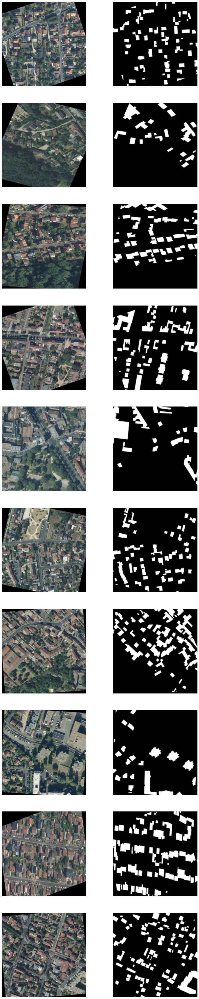

In [ ]:
show_images(dataloader_training,num = 10)

The mislabeled data will certainly affect the performance of our architectures. So we hope to have the most positive result as possible but not to reach the state-of-art of the domain since building footprints semantic segmentation is a very active research domain.

### Loss and metric

The metric used to evaluate the score
of our training was the Dice Coefficient, also known as F1
score:

Dice = $\frac{2 \times | A \cap B|}{|A| + |B|}$ = 2 $\times \frac{\text{precision} \times \text{recall}}{\text{precision} + \text{recall}}$

where A is the ground truth and B the predicted label. It is very similar to the Jaccard Index, also known as IOU (Intersection over Union):

Jaccard = $\frac{| A \cap B|}{|A \cup B|}$

The loss was set to the opposite of the dice coefficient :

Loss = 1 - Dice

In [ ]:
def dice_coef(y_true, y_pred):
  y_pred = torch.sigmoid(y_pred)
  numerator = 2 * torch.sum(y_true * y_pred)
  denominator = torch.sum(y_true + y_pred)
  return numerator/denominator
def dice_loss(y_true, y_pred):
  return 1 - dice_coef(y_true,y_pred)

### Plot functions

In [ ]:
def plot_history_coef(models):
    fig, axs = plt.subplots(1,2,sharey=True,figsize=(18,5))
    for model in models:
            axs[0].plot(range(len(model.train_coef)), model.train_coef, lw=2, label= model.name)
            axs[1].plot(range(len(model.valid_coef)), model.valid_coef, lw=2, label= model.name)
    axs[0].set_title("Training Dice coefficient", fontsize=16)
    axs[1].set_title("Validation Dice coefficient", fontsize=16)
    for ax in axs:
        ax.legend(fontsize=14)
        ax.set_xlabel('Epoch', fontsize=14)
        ax.set_ylabel('Dice coefficient', fontsize=14)

In [ ]:
def plot_history_loss(models):
    fig, axs = plt.subplots(1,2,sharey=True,figsize=(18,5))
    for model in models:
            axs[0].plot(range(len(model.train_loss)), model.train_loss, lw=2, label= model.name)
            axs[1].plot(range(len(model.valid_loss)), model.valid_loss, lw=2, label= model.name)
    axs[0].set_title("Training Loss", fontsize=16)
    axs[1].set_title("Validation Loss", fontsize=16)
    for ax in axs:
        ax.legend(fontsize=14)
        ax.set_xlabel('Epoch', fontsize=14)
        ax.set_ylabel('Loss', fontsize=14)

### Models

#### Unet from scratch

Our first model is Unet implemented from scratch

In [ ]:
class double_conv(nn.Module):
    """(conv => BN => ReLU) * 2"""

    def __init__(self, in_ch, out_ch):
        super(double_conv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        x = self.conv(x)
        return x


class inconv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(inconv, self).__init__()
        self.conv = double_conv(in_ch, out_ch)

    def forward(self, x):
        x = self.conv(x)
        return x


class down(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(down, self).__init__()
        self.mpconv = nn.Sequential(nn.MaxPool2d(2), double_conv(in_ch, out_ch))

    def forward(self, x):
        x = self.mpconv(x)
        return x


class up(nn.Module):
    def __init__(self, in_ch, out_ch, bilinear=True):
        super(up, self).__init__()

        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_ch // 2, in_ch // 2, 2, stride=2)

        self.conv = double_conv(in_ch, out_ch)

    def forward(self, x1, x2):
        x1 = self.up(x1)

        # input is CHW
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, (diffX // 2, diffX - diffX // 2, diffY // 2, diffY - diffY // 2))
        
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)


class outconv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(outconv, self).__init__()
        self.conv = nn.Conv2d(in_ch, out_ch, 1)

    def forward(self, x):
        x = self.conv(x)
        return x


class UNet(pl.LightningModule):
    def __init__(self, name):
        super(UNet, self).__init__()
        self.name = name

        self.inc = inconv(3, 64)
        self.down1 = down(64, 128)
        self.down2 = down(128, 256)
        self.down3 = down(256, 512)
        self.down4 = down(512, 512)
        self.up1 = up(1024, 256, False)
        self.up2 = up(512, 128, False)
        self.up3 = up(256, 64, False)
        self.up4 = up(128, 64, False)
        self.outc = outconv(64, 1)

        self.learning_rate = 0.001
        self.moment = 0.9

        self.valid_coef = []
        self.valid_loss = []

        self.train_coef = []
        self.train_loss = []

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        x = self.outc(x)
        return x

    def _step_util(self, batch, batch_idx, step_type):
        x, y = batch
        logits = self(x)
        loss = dice_loss(y,logits)
        coef = dice_coef(y,logits)
        self.log(step_type + "_loss", loss, on_step=True, on_epoch=True, prog_bar=False, logger=True)
        self.log(step_type + "_coef", coef, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return {"loss":loss,'coef':coef}

    def training_step(self, batch, batch_idx):
        return self._step_util(batch, batch_idx, "train")

    def validation_step(self, batch, batch_idx):
        return self._step_util(batch, batch_idx, "valid")

    def _epoch_util(self,outputs,epoch_type):
        avg_loss = torch.stack([x['loss'] for x in outputs]).mean()
        avg_coef = torch.stack([x['coef'] for x in outputs]).mean()
        if epoch_type == 'train':
            self.train_coef.append(avg_coef)
            self.train_loss.append(avg_loss)
        if epoch_type == 'valid':
            self.valid_coef.append(avg_coef)
            self.valid_loss.append(avg_loss)

    def validation_epoch_end(self,outputs):
        self._epoch_util(outputs,'valid')
    def training_epoch_end(self,outputs):
        self._epoch_util(outputs,'train')

    def configure_optimizers(self):
        optimizer = torch.optim.SGD(self.parameters(),lr = self.learning_rate, momentum = self.moment, nesterov = True)
        lr_scheduler = ReduceLROnPlateau(optimizer,factor = 0.5,patience = 3, verbose = True)
        return {
            'optimizer': optimizer,
            'lr_scheduler': lr_scheduler,
            'monitor': 'valid_loss_epoch'
        }

In [2]:
unet = UNet("Unet_from_scratch")

This is the architecture of our first model:

In [ ]:
print(unet)

UNet(
  (inc): inconv(
    (conv): double_conv(
      (conv): Sequential(
        (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
  )
  (down1): down(
    (mpconv): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): double_conv(
        (conv): Sequential(
          (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (4): BatchNorm2

We did follow the architecture of a classic unet like below :
We have 1 in convolutional block, 4 downsampling blocks and 4 upsampling blocks, and 1 out convolutional block.

Inconv block is of the form :
(Conv2D => BatchNorm2D => Relu) x 2

Each downsampling block is of the form :
MaxPool2D => (Conv2D => BatchNorm2D => Relu) x 2

Each upsampling block is of the form :
ConvTranspose2D => (Conv2D => BatchNorm2D => Relu) x 2

For summary, we have :

Inconv => down x 4 => up x 4 => outconv

For the optimizer, we use a SGD with a learning rate of 0.001 and a momentum of 0.9. We also use a learning rate scheduler which is a reduce learning rate on plateau with a patience of 3 epochs and a factor of 0.5

Since we don't have many data, we set training batchsize equals 4 and we will train this model for 25 epochs

In [ ]:
trainer = pl.Trainer(gpus=1,max_epochs = 25)
trainer.fit(unet, train_dataloader=dataloader_training, val_dataloaders=dataloader_validation)

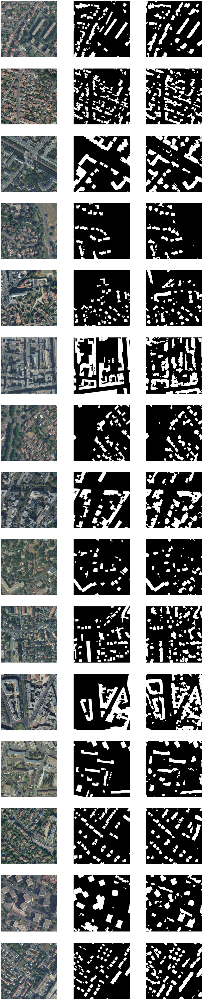

In [ ]:
show_images(dataloader_validation,model = unet,num = 15)

As we can see here, the model can localize well buildings but can't capture geometric features like boundary detections.

#### VGG16 transfer learning

In our second model we used a pre-trained network: VGG16

In [ ]:
def conv3x3(in_, out):
    return nn.Conv2d(in_, out, 3, padding=1)

class ConvRelu(nn.Module):
    def __init__(self, in_: int, out: int):
        super(ConvRelu, self).__init__()
        self.conv = conv3x3(in_, out)
        self.activation = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.conv(x)
        x = self.activation(x)
        return x


class DecoderBlock(nn.Module):

    def __init__(self, in_channels, middle_channels, out_channels, is_deconv=True):
        super(DecoderBlock, self).__init__()
        self.in_channels = in_channels

        if is_deconv:
            self.block = nn.Sequential(
                ConvRelu(in_channels, middle_channels),
                nn.ConvTranspose2d(middle_channels, out_channels, kernel_size=4, stride=2,
                                   padding=1),
                nn.ReLU(inplace=True)
            )
        else:
            self.block = nn.Sequential(
                nn.Upsample(scale_factor=2, mode='bilinear'),
                ConvRelu(in_channels, middle_channels),
                ConvRelu(middle_channels, out_channels),
            )

    def forward(self, x):
        return self.block(x)

class UNetVGG16(pl.LightningModule):
    def __init__(self, name, num_filters=32):
        """
        :param num_classes:
        :param num_filters:
        :param pretrained:
            False - no pre-trained network used
            True - encoder pre-trained with VGG11
        """
        super().__init__()
        self.name = name

        self.pool = nn.MaxPool2d(2, 2)

        self.encoder = torchvision.models.vgg16(pretrained=True).features

        self.relu = nn.ReLU(inplace=True)

        self.conv1 = nn.Sequential(self.encoder[0],
                                   self.relu,
                                   self.encoder[2],
                                   self.relu)

        self.conv2 = nn.Sequential(self.encoder[5],
                                   self.relu,
                                   self.encoder[7],
                                   self.relu)

        self.conv3 = nn.Sequential(self.encoder[10],
                                   self.relu,
                                   self.encoder[12],
                                   self.relu,
                                   self.encoder[14],
                                   self.relu)

        self.conv4 = nn.Sequential(self.encoder[17],
                                   self.relu,
                                   self.encoder[19],
                                   self.relu,
                                   self.encoder[21],
                                   self.relu)

        self.conv5 = nn.Sequential(self.encoder[24],
                                   self.relu,
                                   self.encoder[26],
                                   self.relu,
                                   self.encoder[28],
                                   self.relu)

        self.center = DecoderBlock(512, num_filters * 8 * 2, num_filters * 8)

        self.dec5 = DecoderBlock(512 + num_filters * 8, num_filters * 8 * 2, num_filters * 8)
        self.dec4 = DecoderBlock(512 + num_filters * 8, num_filters * 8 * 2, num_filters * 8)
        self.dec3 = DecoderBlock(256 + num_filters * 8, num_filters * 4 * 2, num_filters * 2)
        self.dec2 = DecoderBlock(128 + num_filters * 2, num_filters * 2 * 2, num_filters)
        self.dec1 = ConvRelu(64 + num_filters, num_filters)
        self.final = nn.Conv2d(num_filters, 1, kernel_size=1)

        self.learning_rate = 0.001
        self.moment = 0.9

        self.valid_coef = []
        self.valid_loss = []

        self.train_coef = []
        self.train_loss = []

    def forward(self, x):
        conv1 = self.conv1(x)
        conv2 = self.conv2(self.pool(conv1))
        conv3 = self.conv3(self.pool(conv2))
        conv4 = self.conv4(self.pool(conv3))
        conv5 = self.conv5(self.pool(conv4))

        center = self.center(self.pool(conv5))

        dec5 = self.dec5(torch.cat([center, conv5], 1))

        dec4 = self.dec4(torch.cat([dec5, conv4], 1))
        dec3 = self.dec3(torch.cat([dec4, conv3], 1))
        dec2 = self.dec2(torch.cat([dec3, conv2], 1))
        dec1 = self.dec1(torch.cat([dec2, conv1], 1))
        x_out = self.final(dec1)

        return x_out

    def _step_util(self, batch, batch_idx, step_type):
        x, y = batch
        logits = self(x)
        loss = dice_loss(y,logits)
        coef = dice_coef(y,logits)
        self.log(step_type + "_loss", loss, on_step=True, on_epoch=True, prog_bar=False, logger=True)
        self.log(step_type + "_coef", coef, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return {"loss":loss,'coef':coef}

    def training_step(self, batch, batch_idx):
        return self._step_util(batch, batch_idx, "train")

    def validation_step(self, batch, batch_idx):
        return self._step_util(batch, batch_idx, "valid")

    def _epoch_util(self,outputs,epoch_type):
        avg_loss = torch.stack([x['loss'] for x in outputs]).mean()
        avg_coef = torch.stack([x['coef'] for x in outputs]).mean()
        if epoch_type == 'train':
            self.train_coef.append(avg_coef)
            self.train_loss.append(avg_loss)
        if epoch_type == 'valid':
            self.valid_coef.append(avg_coef)
            self.valid_loss.append(avg_loss)

    def validation_epoch_end(self,outputs):
        self._epoch_util(outputs,'valid')
    def training_epoch_end(self,outputs):
        self._epoch_util(outputs,'train')

    def configure_optimizers(self):
        optimizer = torch.optim.SGD(self.parameters(),lr = self.learning_rate, momentum = self.moment, nesterov = True)
        lr_scheduler = ReduceLROnPlateau(optimizer,factor = 0.5,patience = 3, verbose = True)
        return {
            'optimizer': optimizer,
            'lr_scheduler': lr_scheduler,
            'monitor': 'valid_loss_epoch'
        }

In [ ]:
unet_vgg16 = UNetVGG16("Unet_vgg16")

This is the architecture of our second model:

In [ ]:
print(unet_vgg16)

UNetVGG16(
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (encoder): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (

Here we have implemented a Unet with VGG16 backbone with pre-trained weights on ImageNet. We also set batch size to 4 and epochs to 25 and use the same optimizer for training phase in order to compare with the model training from scratch.

In [ ]:
trainer = pl.Trainer(gpus=1,max_epochs = 25)
trainer.fit(unet_vgg16, train_dataloader=dataloader_training, val_dataloaders=dataloader_validation)

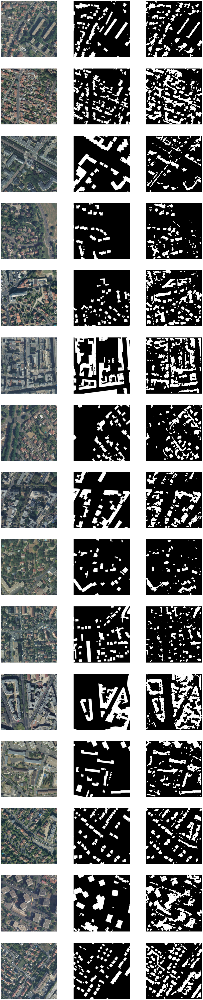

In [ ]:
show_images(dataloader_validation,model = unet_vgg16,num = 15)

# Results

In [ ]:
models = []
models.append(unet)
models.append(unet_vgg16)

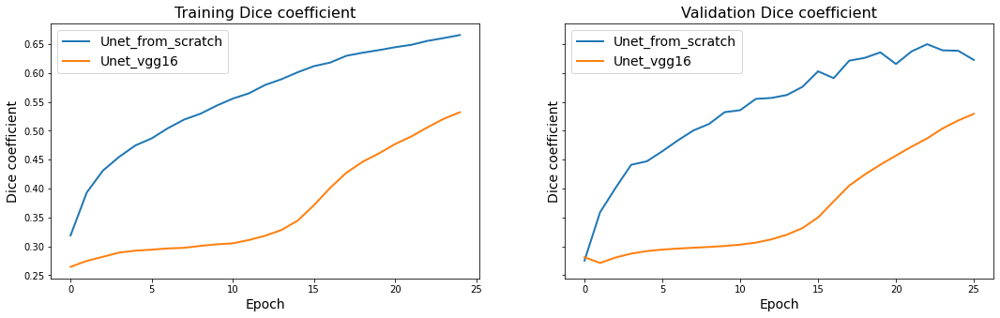

In [ ]:
plot_history_coef(models)

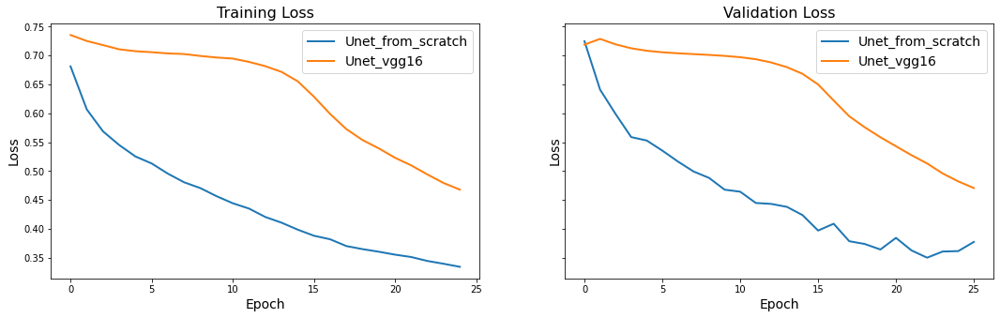

In [ ]:
plot_history_loss(models)

# Discussion

Surprisingly, we observe that the training from scratch version works better than the pre-trained version. The pre-trained model captures much more False Positive than the training from scratch model. The pre-trained model predicts roads and trees as buildings.

Maybe, we trained those models for a too-short time, and the pre-trained one needs more training. However, because of the limited usage of GPU of Google Colab, we cannot train models for longer.

We see that our network mainly fails on mislabeled or blurry
data. Often, either the masks are wrongly defined by IGN or the satellite images are not up to date. This points to an interesting application of our method: detecting those kind of errors on open-source mapping platforms like IGN to correct the layers, or update satellite images where it is more needed. However, we see by looking at the results that even for correctly classified images, there is room for improvement, notably when it comes to boundary detection.

The main weakness of our model is that it fails at detecting
building boundaries with great precision. It has a propensity
to give us soft edges, instead of sharp and well defined ones.
This is especially an issue in densely populated areas where
buildings are close.



For further work, we can modify our loss function, our architecture for better boundary detection. There are many works on that problem.

We can also put post-processing steps to our pipeline for example to eliminate small misclassified portions.

# Sources

https://towardsdatascience.com/creating-and-training-a-u-net-model-with-pytorch-for-2d-3d-semantic-segmentation-dataset-fb1f7f80fe55

https://arxiv.org/pdf/1505.04597.pdf

https://geoservices.ign.fr/documentation/diffusion/telechargement-donnees-libres.html

https://www.kaggle.com/witwitchayakarn/u-net-with-pytorch

https://www.kaggle.com/balraj98/unet-for-building-segmentation-pytorch

https://github.com/IanTaehoonYoo/semantic-segmentation-pytorch

https://www.hindawi.com/journals/isrn/2013/819768/

https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6427113/
